# PeruSat-1: Predicción

En este notebook se describen los pasos para predecir y clasificar con un modelo entrenado de U-Net para PeruSat-1.

A modo de ejemplo, se asume que se va a utilizar el modelo entrenado en el notebook **Perusat-1: Entrenamiento**.

In [4]:
from satlomasproc.unet.train import TrainConfig, train
from satlomasproc.unet.predict import PredictConfig, predict
from satlomasproc.unet.evaluate import plot_data_generator
import os

In [5]:
BASE_DIR = os.path.join(os.path.expanduser('~'), 'data', 'lomas', 'ps1')

## Predicción sobre dataset de entrenamiento

Primero probaremos el modelo contra el mismo conjunto de datos que se utilizó para el entrenamiento.

In [6]:
MODEL_PATH = os.path.join(BASE_DIR, 'weights', 'lomas_ps1_v6b.h5')

De la misma manera que al entrenar, debemos construir un objeto de configuración con variables:
* `images_path`: La ruta a los chips a predecir. En este caso vamos a usar la misma ruta de los chips de entrenamiento, para escenas nuevas debemos correr `extract_chips` de nuevo.
* `results_path`: La ruta al directorio con los chips resultado.
* `batch_size`: Tamaño del lote, idem entrenamiento
* `model_path`: La ruta al modelo previamente entrenado.
* `height` y `width`: Tamaño de los chips a predecir. En este caso, igual que en el entrenamiento.
* `n_channels`: Cantidad de canales, debe coincidir con la variable de entrenamiento.
* `n_classes`: Cantidad de clases, debe coincidir con la variable de entrenamiento.

Al predecir, se generan nuevos chips, con una banda por clase y donde cada pixel representa la probabilidad de que ese pixel pertenezca a cada clase. En otras palabras son máscaras de probabilidad por clase. Esto es así dado que la red neuronal usa *binary cross-entropy* como función de pérdida.

In [8]:
predict_config = PredictConfig(
    images_path=os.path.join(BASE_DIR, 'train', '320_160'),
    results_path=os.path.join(BASE_DIR, 'train', '320_160', 'results', 'v6'),
    batch_size=32,
    model_path=MODEL_PATH,
    height=320,
    width=320,
    n_channels=3,
    n_classes=5)

Procedemos con el proceso de predicción con la función `predict`:

In [9]:
predict(predict_config)


Instructions for updating:
Use `tf.cast` instead.

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
Deprecated in favor of operator or tf.math.divide.



  0%|          | 0/205 [00:00<?, ?it/s]

100%|██████████| 205/205 [05:41<00:00,  1.67s/it]

Done!


Los resultados deberían generarse en `$BASE_DIR/train/320_160/results/v6`

Vamos a plotear los resultados junto con las máscaras de entrenamiento, para comparar. El siguiente código toma una muestra de 20 chips, y plotea dos filas para cada muestra: 1) Imagen + Máscara de probabilidad y 2) Imagen + máscara de anotaciones.

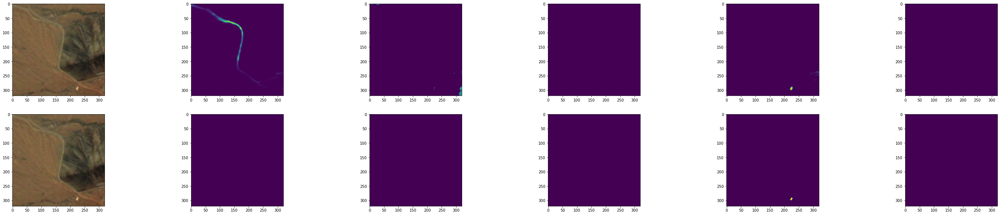

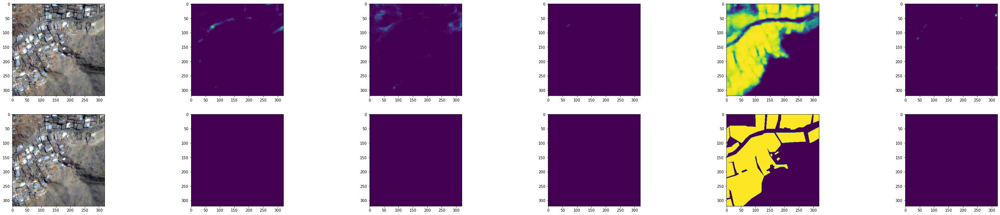

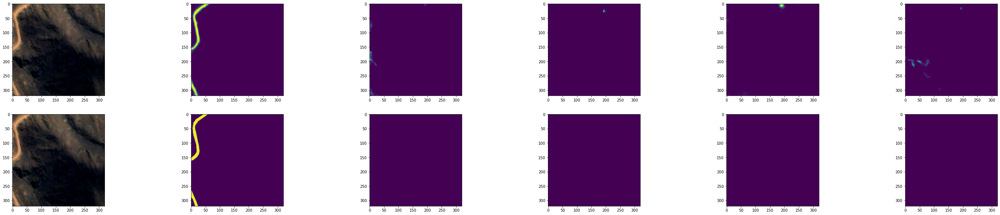

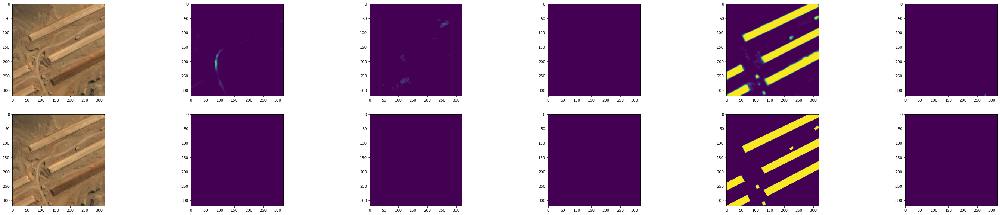

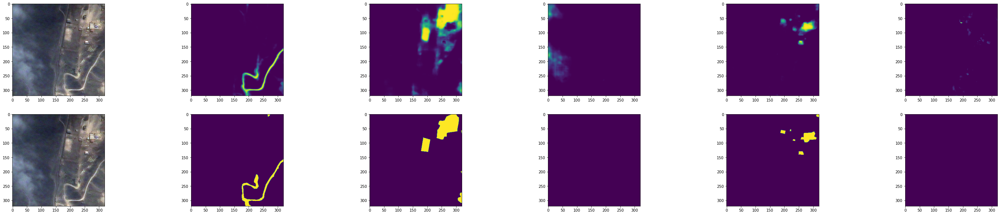

...

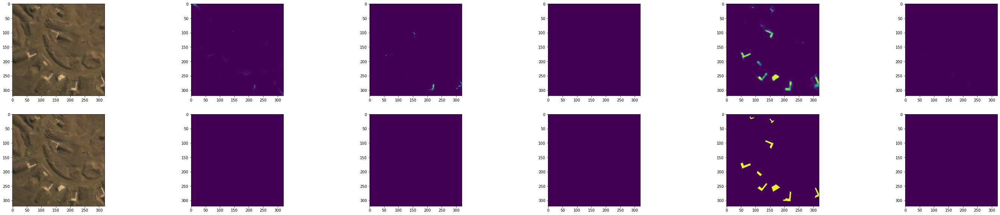

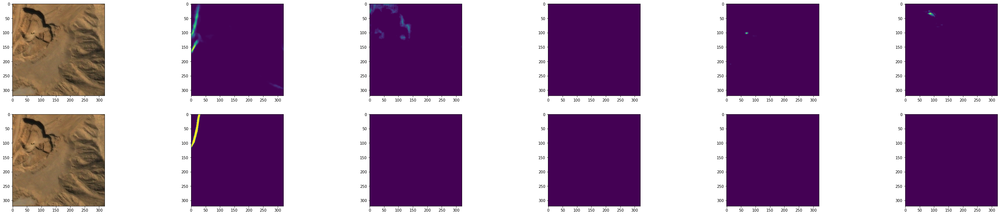

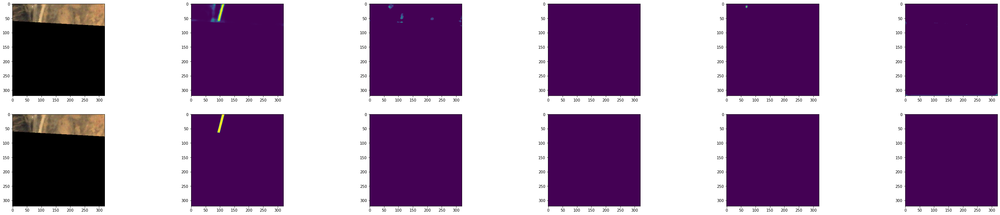

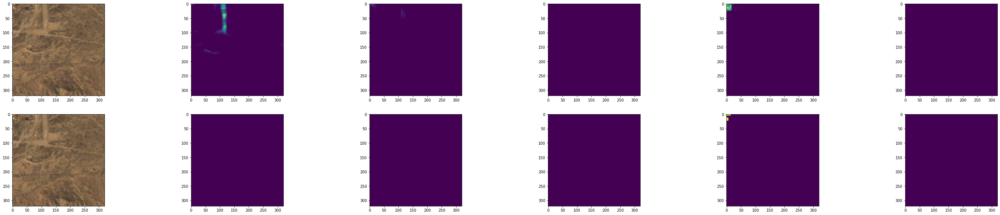

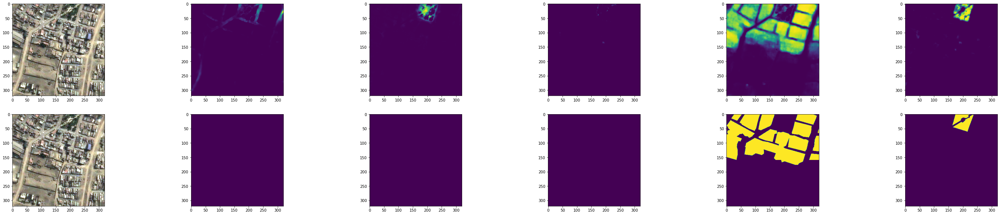

In [10]:
import tifffile as tiff
from skimage.transform import resize
from sklearn.preprocessing import minmax_scale
import matplotlib.pyplot as plt
import random
import numpy as np
from glob import glob

H = 20

cfg = predict_config
images = [os.path.basename(f) for f in sorted(glob(os.path.join(cfg.images_path, 'images', '*.tif')))]

# Sample
#images = images[:H] 
images = random.sample(images, H)

for img_file in images:
    img_ = tiff.imread(os.path.join(cfg.images_path, 'images', img_file))[:,:,:cfg.n_channels]
    img_ = minmax_scale(img_.ravel(), feature_range=(0, 255)).reshape(img_.shape)
    img_ = resize(img_, (cfg.height, cfg.width), mode='constant', preserve_range=True).astype(np.uint8)

    # mask
    mask_v = tiff.imread(os.path.join(cfg.images_path, 'masks', img_file)) / 255
    mask_v = resize(mask_v, (cfg.height, cfg.width), mode='constant', preserve_range=True)

    # Prediccion
    mask_ = tiff.imread(os.path.join(cfg.results_path, img_file)) / 255
    mask_ = resize(mask_, (cfg.height, cfg.width), mode='constant', preserve_range=True)   

    fig, axes = plt.subplots(nrows=2, ncols=cfg.n_classes + 1, figsize=(cfg.n_classes * 10, 10)) 
    axes[0][0].imshow(img_)
    axes[1][0].imshow(img_)
    for c in range(cfg.n_classes):
        axes[0][1+c].imshow(mask_[:,:,c])
        axes[1][1+c].imshow(mask_v[:,:,c])
    plt.show()
    print("=================================================================================")

## Predicción de las escenas de entrenamiento enteras

Esta vez, no solo vamos a predecir sobre las áreas anotadas, si no sobre toda la cobertura de las escenas de entrenamiento. Para esto tendremos que volver a extraer chips, dado que los chips de entrenamiento sólo son chips que contienen anotaciones, y ahora queremos todas las imágenes.

Para esto, corremos el mismo comando pero con algunas variaciones:
* A diferencia del entrenamiento, no usaremos `--labels`. No necesitamos generar máscaras, y además esta opción hace que se generen chips que contengan anotaciones solamente.
* No especificamos un `--step-size`, porque no queremos solapamiento en este caso.

```bash
satproc_extract_chips \
    -v --size 320 \
    -o $BASE_DIR/train/320_320/ \
    --bands 1 2 3 \
    --classes C D N U V \
    --aoi $BASE_DIR/train/raw/aoi.shp \
    $BASE_DIR/train/raw/CARABAYLLO_20200509_clip_rgb.tif \
    $BASE_DIR/train/raw/MANGOMARCA_20200422_clip_rgb.tif \
    $BASE_DIR/train/raw/CICASOS_20200422_clip_rgb.tif
```

In [11]:
predict_config = PredictConfig(
    images_path=os.path.join(BASE_DIR, 'train', '320_320'),
    results_path=os.path.join(BASE_DIR, 'train', '320_320', 'results', 'v6'),
    batch_size=32,
    model_path=MODEL_PATH,
    height=320,
    width=320,
    n_channels=3,
    n_classes=5)
predict(predict_config)

100%|██████████| 990/990 [26:36<00:00,  1.61s/it]

Done!


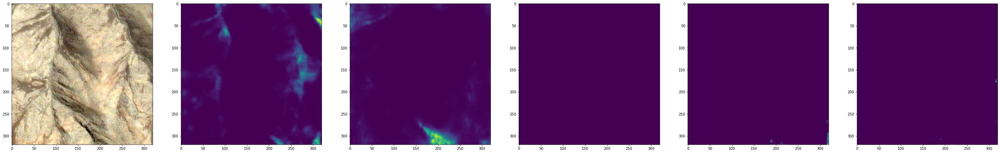

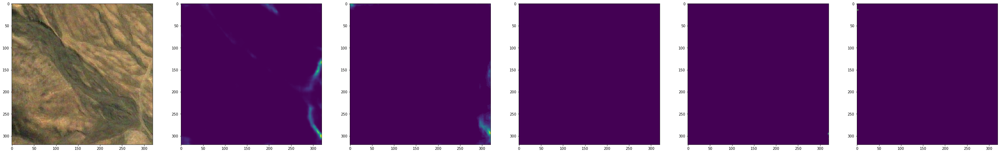

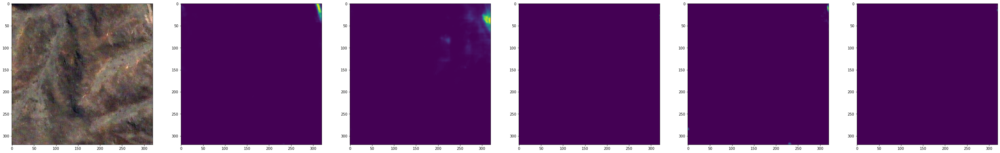

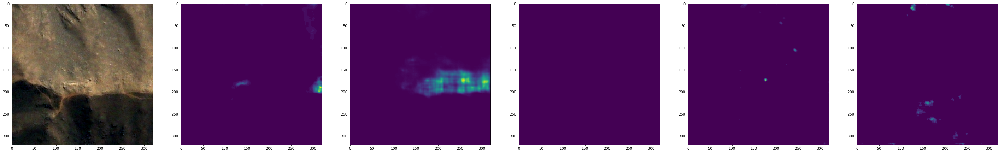

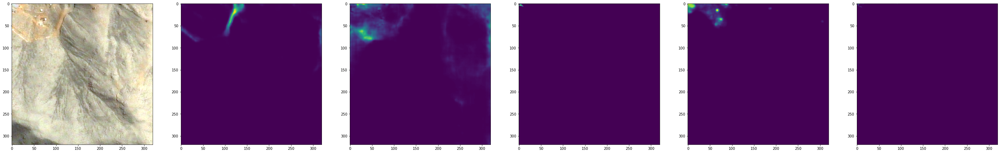

...

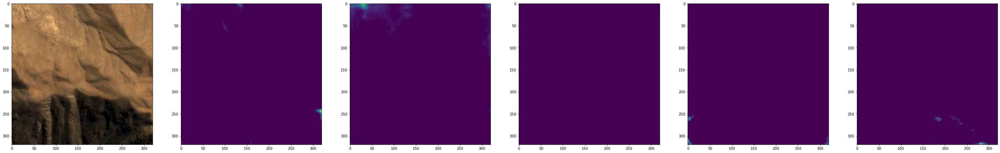

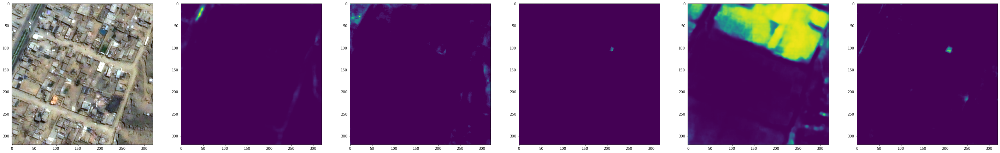

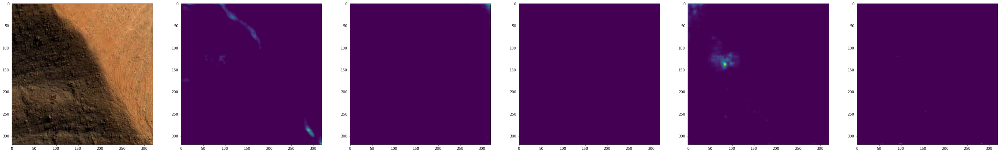

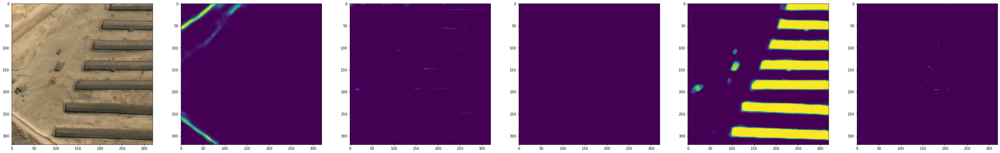

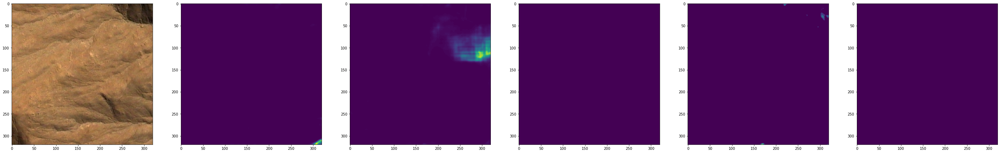

In [12]:
import tifffile as tiff
from skimage.transform import resize
from sklearn.preprocessing import minmax_scale
import matplotlib.pyplot as plt
import random
import numpy as np
from glob import glob

H = 20

cfg = predict_config
images = [os.path.basename(f) for f in sorted(glob(os.path.join(cfg.images_path, 'images', '*.tif')))]

# Sample
#images = images[:H] 
images = random.sample(images, H)

for img_file in images:
    img_ = tiff.imread(os.path.join(cfg.images_path, 'images', img_file))[:,:,:cfg.n_channels]
    img_ = minmax_scale(img_.ravel(), feature_range=(0, 255)).reshape(img_.shape)
    img_ = resize(img_, (cfg.height, cfg.width), mode='constant', preserve_range=True).astype(np.uint8)

    # Prediccion
    mask_ = tiff.imread(os.path.join(cfg.results_path, img_file)) / 255
    mask_ = resize(mask_, (cfg.height, cfg.width), mode='constant', preserve_range=True)   

    fig, axes = plt.subplots(nrows=1, ncols=cfg.n_classes + 1, figsize=(cfg.n_classes * 10, 10)) 
    axes[0].imshow(img_)
    for c in range(cfg.n_classes):
        axes[1+c].imshow(mask_[:,:,c])
    plt.show()